# Check out how the channel might meander from the old radarlines to new

Interpolation of old and new radarline comes from 26_RADAR_interpolate_line2line_by_distance_downchan


In [1]:
import matplotlib.pyplot as plt
import numpy as np
import glob
import os
import sys
import time
import datetime as dt
import pandas as pd
import geopandas as gpd
import scipy as sp
from scipy import signal
from tqdm.notebook import tqdm
import rasterio as rio
from shapely.geometry import Point, LineString, Polygon, MultiPoint
import fiona
from shapely.ops import nearest_points

In [2]:
new_gpr = gpd.read_file('/Volumes/arc_04/FIELD_DATA/K8621920/RES/PROCESSED_LINES/picked_bed.shp')
old_gpr = gpd.read_file('/Volumes/arc_04/FIELD_DATA/K8621920/RES/PROCESSED_LINES/1516_gprlines.shp')
old_gpr['camp'] = 'KIS2' 
bed_gdf = pd.concat([new_gpr,old_gpr])
gdf = bed_gdf[bed_gdf.camp =='KIS2'].copy()
ngpr = new_gpr[new_gpr.camp =='KIS2'].copy()

In [3]:
x_old = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/channel_line2line_interpbydistold_points_x.npy')
y_old = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/channel_line2line_interpbydistold_points_y.npy')
it_old = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/channel_line2line_interpbydistold_ice_thickn.npy')

In [4]:
x_new = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/channel_line2line_interpbydist_points_x.npy')
y_new = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/channel_line2line_interpbydist_points_y.npy')
# ice thickness
it_new = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/channel_line2line_interpbydist_ice_thickn.npy')
# ice base elevation
ib_new = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/channel_line2line_interpbydist_icebase.npy')

# plot channel over REMA surface

In [6]:
#load REMA
nid1 = 159202
nid2 = 131226
df = gpd.read_file('/Volumes/arc_02/whitefar/DATA/REMOTE_SENSING/REMA_STRIPES/REMA_Strip_Index_Rel1/REMA_Strip_Index_Rel1.shp')
path = f"/Volumes/arc_02/whitefar/DATA/REMOTE_SENSING/REMA_STRIPES/DIFFERENCES/REMA_{nid1}-{nid2}_diff.tif"
f = df.loc[nid1].acquisitio
t =df.loc[nid2].acquisitio
duration = (pd.to_datetime(t)-pd.to_datetime(f)).days/365.25
with rio.open(path) as image:
    im = image.read(1)
    im[im==-9999] = np.nan
    im = im / duration
    extent_REMAdiff = [image.bounds[0],image.bounds[2],image.bounds[1],image.bounds[3]]
with rio.open('/Volumes/arc_02/whitefar/DATA/REMOTE_SENSING/REMA_STRIPES/SETSM_WV01_20161109_1020010058134D00_10200100576C9100_seg1_2m_v1.0_dem.tif') as image:
    extent_REMA = [image.bounds[0],image.bounds[2],image.bounds[1],image.bounds[3]]
    im_REMA = image.read(1)/100

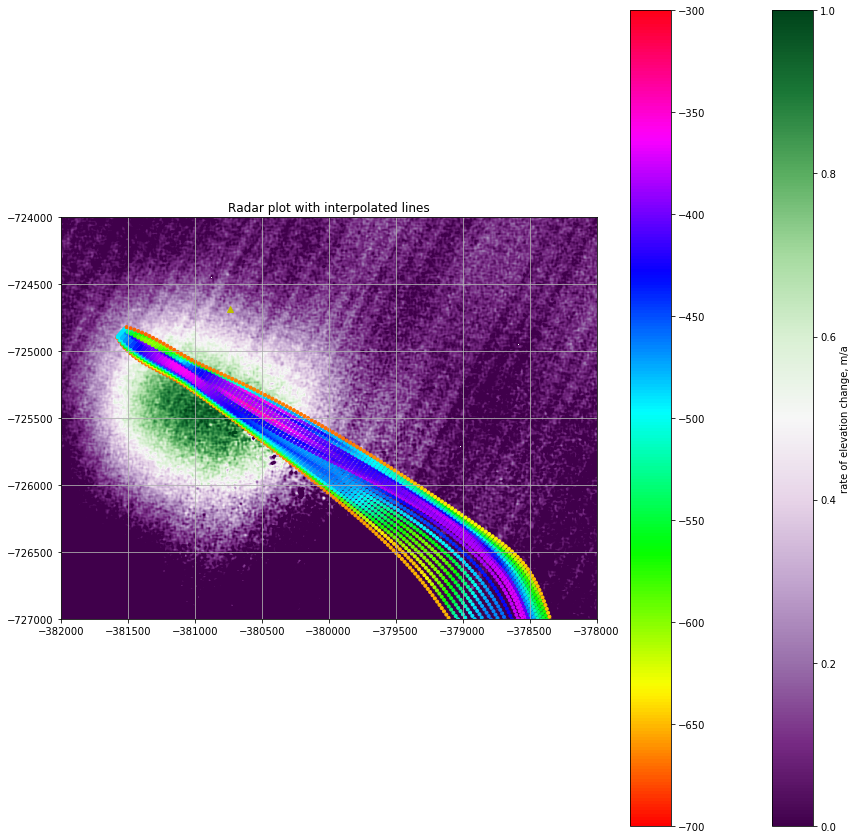

In [6]:
#rema
v=[0,1]    

extent_REMA1 = [image.bounds[0],image.bounds[2],image.bounds[1],image.bounds[3]]
kis2 = [-380737.537026,-724683.311299]
plt.figure(figsize=(15,15))
# GyRd = plt.cm.get_cmap('PuOr').reversed()
plt.imshow(im,extent=extent_REMA1, vmin=v[0],vmax=v[1],cmap='PRGn')
cb = plt.colorbar()
plt.plot(kis2[0],kis2[1],'y^')
cb.set_label('rate of elevation change, m/a')

# radar
plt.scatter( x_new,y_new,c=ib_new,cmap='hsv',vmin=-700, vmax=-300,marker='.')
# plt.scatter( gdf.x,gdf.y,c=gdf.ice_thickn,cmap='hsv',vmin=400, vmax=800)

plt.colorbar()
plt.title('Radar plot with interpolated lines')
plt.xlim([-382000, -378000])
plt.ylim([-727000,-724000])
plt.grid()
plt.show()

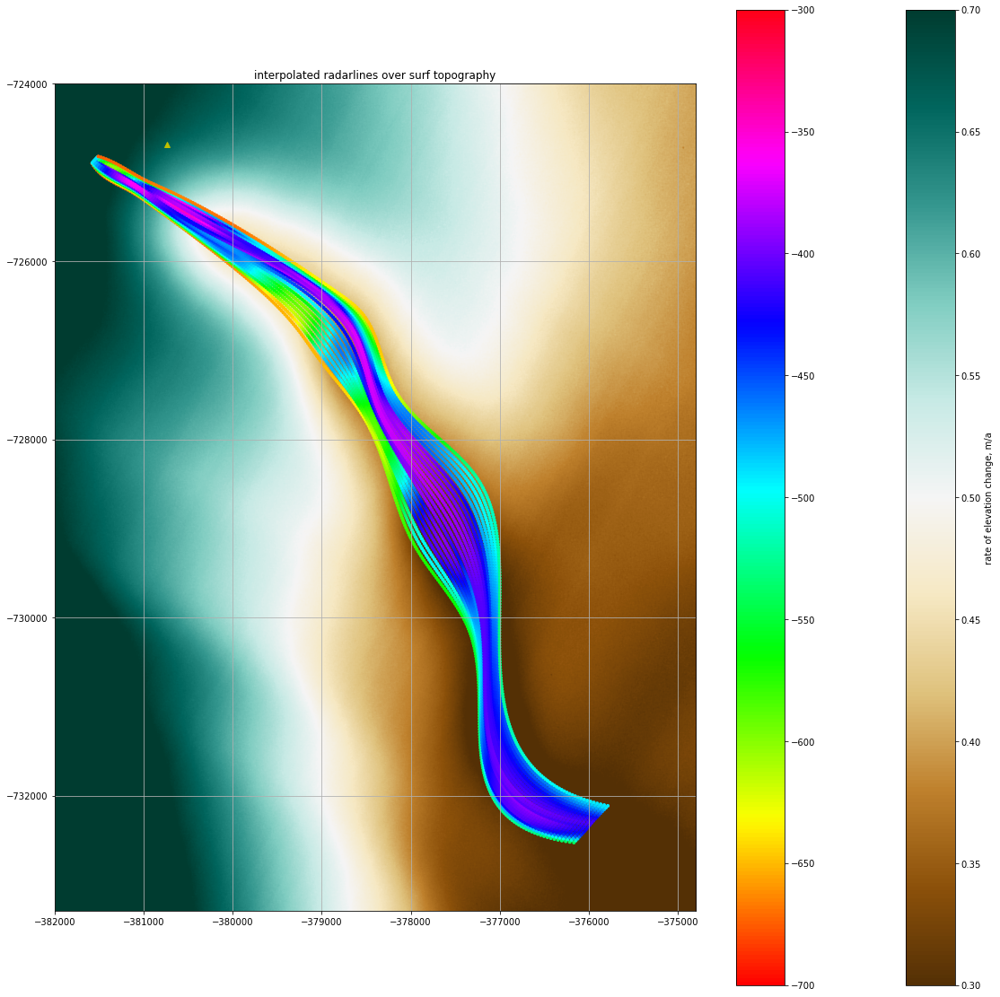

In [7]:
#rema
v=[0,1]    

kis2 = [-380737.537026,-724683.311299]
plt.figure(figsize=(20,20))
plt.imshow(im_REMA,extent=extent_REMA,vmin=0.3,vmax=0.7, cmap='BrBG')
cb = plt.colorbar()
cb.set_label('surface elevation (?)')
plt.plot(kis2[0],kis2[1],'y^')
cb.set_label('rate of elevation change, m/a')

# radar
plt.scatter( x_new,y_new,c=ib_new,cmap='hsv',vmin=-700, vmax=-300,marker='.')

plt.colorbar()
plt.title('interpolated radarlines over surf topography')
plt.xlim([-382000, -374800])
plt.ylim([-733300,-724000])
plt.grid()
plt.show()

In [7]:
points_x_surveyed = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/points_x_channel.npy')
points_y_surveyed = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/points_y_channel.npy') 
ice_thickn_surveyed = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/ice_thickn_channel.npy')
base_surveyed = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/bed_channel.npy')
points_x_surveyed_old = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/points_x_channel_old.npy')
points_y_surveyed_old = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/points_y_channel_old.npy') 
ice_thickn_surveyed_old = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/ice_thickn_channel_old.npy')
base_surveyed_old = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/bed_channel_old.npy')

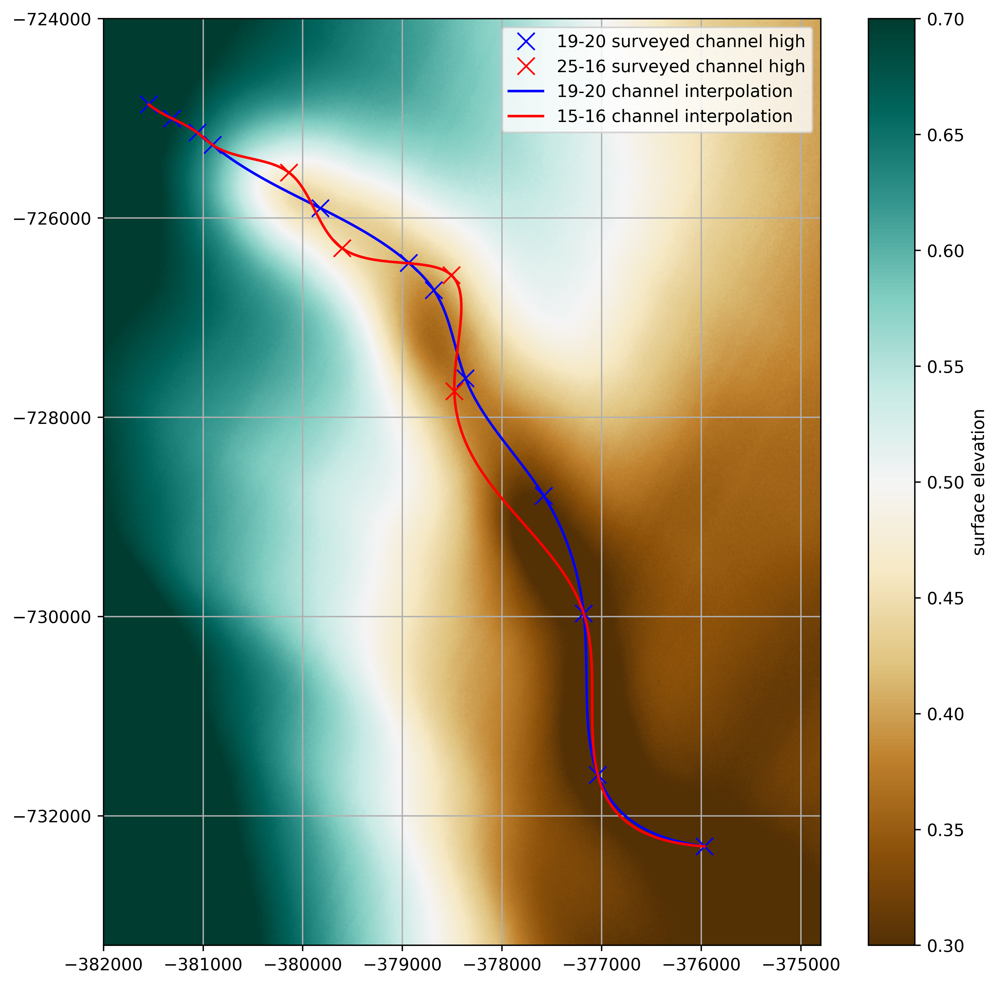

In [16]:
#rema
v=[0,1]    

plt.figure(figsize=(10,10),dpi=500)
extent = [image.bounds[0],image.bounds[2],image.bounds[1],image.bounds[3]]
kis2 = [-380737.537026,-724683.311299]

plt.imshow(im_REMA,extent=extent_REMA,vmin=0.3,vmax=0.7, cmap='BrBG')
cb = plt.colorbar()
# plt.plot(kis2[0],kis2[1],'y^')
cb.set_label('surface elevation')

plt.plot(points_x_surveyed[10,:],points_y_surveyed[10,:],'bx',markersize=10,label='19-20 surveyed channel high')
plt.plot(points_x_surveyed_old[10,:],points_y_surveyed_old[10,:],'rx',markersize=10,label='25-16 surveyed channel high')

i=10
plt.plot(x_new[i,:],y_new[i,:],'b',label="19-20 channel interpolation")
plt.plot(x_old[i,:],y_old[i,:],'r',label="15-16 channel interpolation")

plt.legend()
# plt.title('interpolated radarlines over surf topography')
plt.xlim([-382000, -374800])
plt.ylim([-733300,-724000])
plt.grid()
plt.savefig('/Users/home/whitefar/ASSIGNMENTS-PUBLICATIONS-TALKS/channel_data_writeup/PLOTS/channel_meander.png')
plt.show()

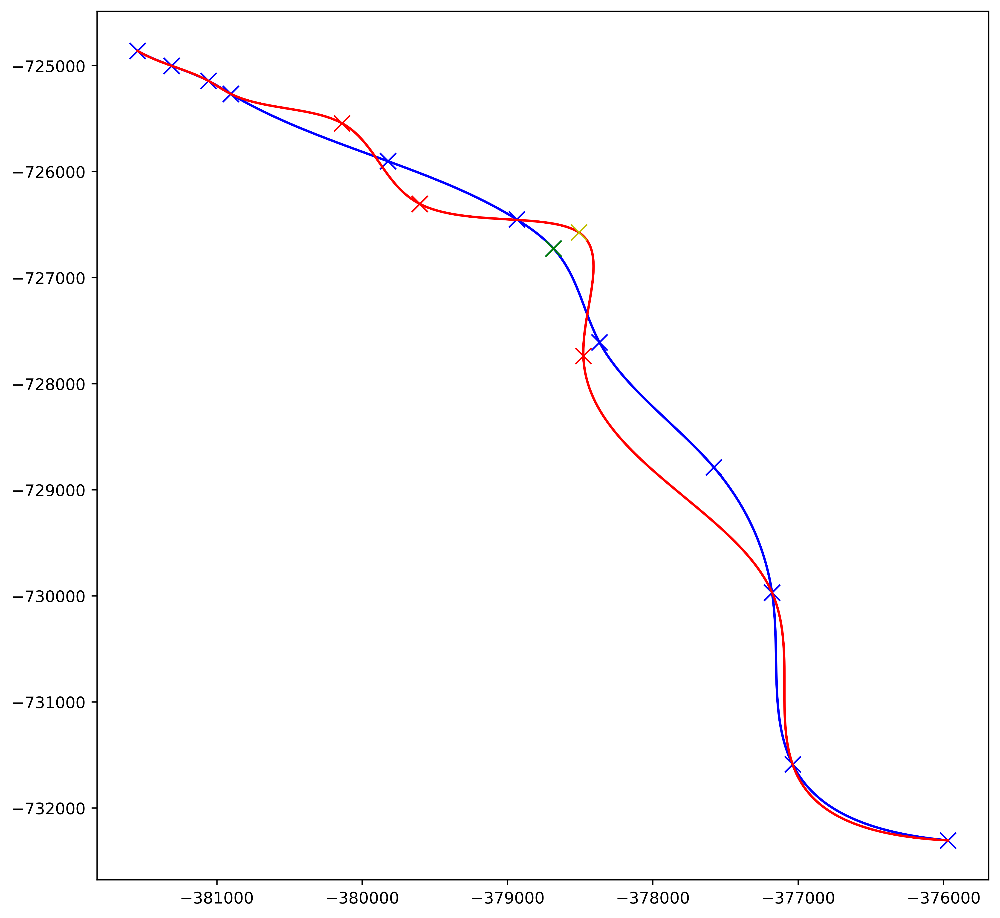

In [21]:
plt.figure(figsize=(10,10),dpi=500)
plt.plot(points_x_surveyed[10,:],points_y_surveyed[10,:],'bx',markersize=10,label='19-20 surveyed channel high')
plt.plot(points_x_surveyed_old[10,:],points_y_surveyed_old[10,:],'rx',markersize=10,label='25-16 surveyed channel high')
plt.plot(x_new[10,:],y_new[10,:],'b',label="19-20 channel interpolation")
plt.plot(x_old[10,:],y_old[10,:],'r',label="15-16 channel interpolation")
i = 6
j = 2
plt.plot(points_x_surveyed[10,i],points_y_surveyed[10,i],'gx',markersize=10,label='19-20 surveyed channel high')
plt.plot(points_x_surveyed_old[10,j],points_y_surveyed_old[10,j],'yx',markersize=10,label='25-16 surveyed channel high')
plt.show()

In [24]:
new_chan = Point(points_x_surveyed[10,i],points_y_surveyed[10,i])
old_chan = Point(points_x_surveyed_old[10,j],points_y_surveyed_old[10,j])
meander_distance = old_chan.distance(new_chan)
print(meander_distance)

231.2745193741563


# Plot underside of ice

In [10]:
direc = '/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/interpolatedgrid_allchan'

xv = np.load(direc + 'x_grid' +'.npy')
yv = np.load(direc + 'y_grid' +'.npy')
thickness_interpolated = np.load(direc +'ice_thickness'+'.npy')
extent_l2l = np.load(direc +'extent.npy')
ice_base = np.load(direc +'_ice_base.npy')
surf_out = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/interpolatedgrid_allchan_REMA_sampled.npy')

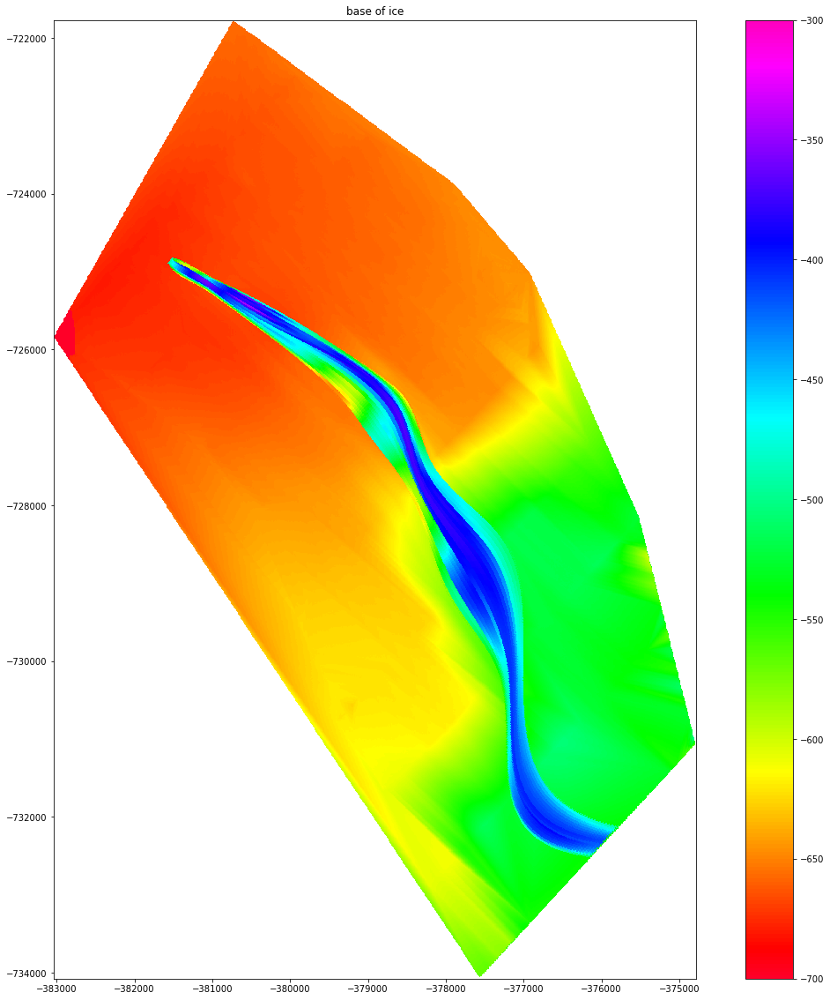

In [11]:
plt.figure(figsize=(20,20))

v = [-750,-350]
plt.imshow(ice_base,extent=extent_l2l,vmin=-700, vmax=-300,cmap='gist_rainbow')
plt.colorbar()
plt.title('base of ice')


plt.show()

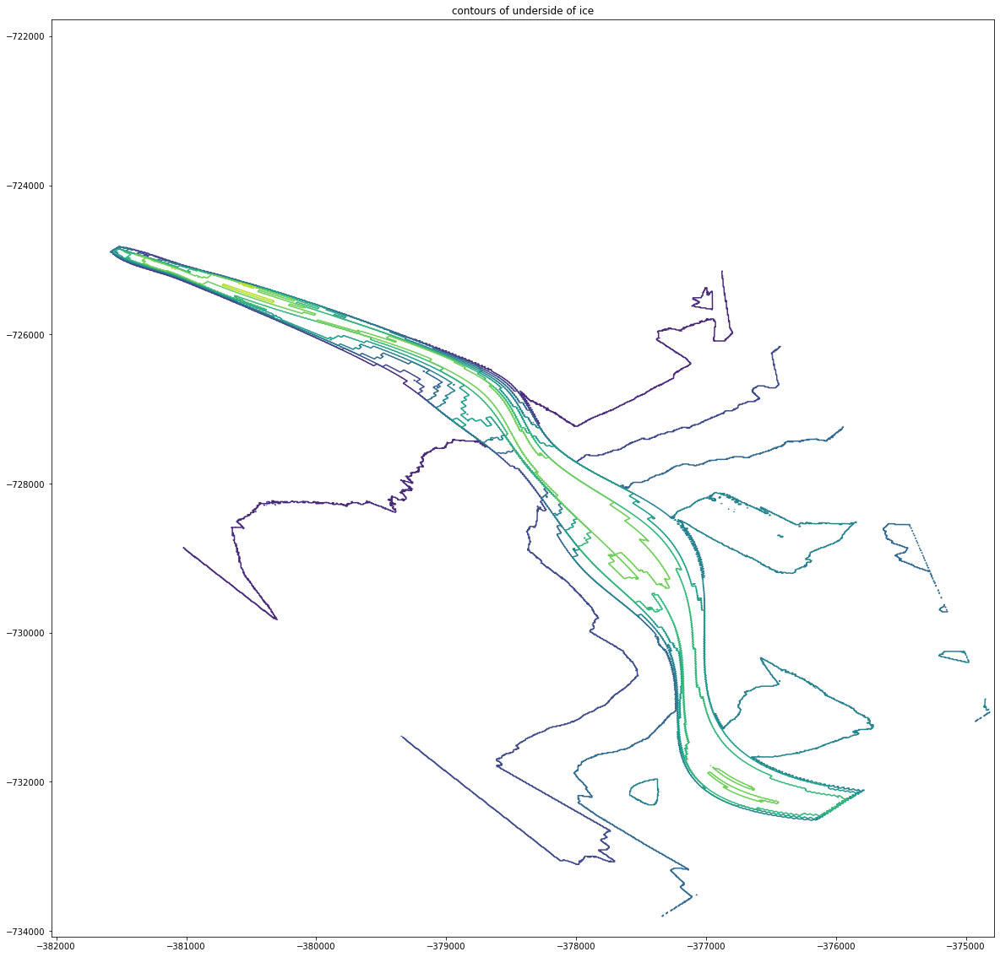

In [12]:
lhs = 500

plt.figure(figsize=(20,20))
plt.contour(xv[:,lhs:],yv[:,lhs:],ice_base[:,lhs:],10)
plt.title('contours of underside of ice')
plt.show()

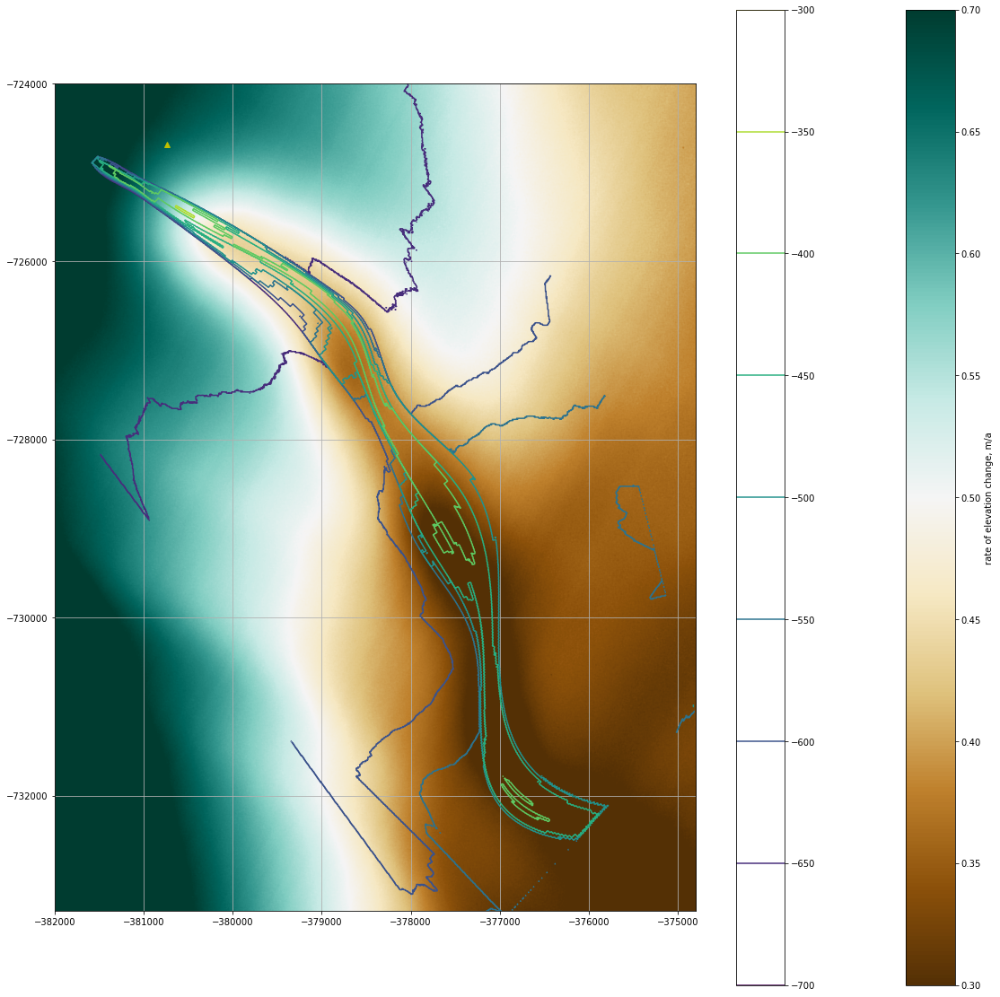

In [14]:
#rema
v=[0,1]    

extent = [image.bounds[0],image.bounds[2],image.bounds[1],image.bounds[3]]
plt.figure(figsize=(20,20))
plt.imshow(im_REMA,extent=extent_REMA,vmin=0.3,vmax=0.7, cmap='BrBG')
cb = plt.colorbar()
cb.set_label('surface elevation (?)')
plt.plot(kis2[0],kis2[1],'y^')
cb.set_label('rate of elevation change, m/a')

plt.contour(xv[:,500:],yv[:,500:],ice_base[:,500:])

plt.colorbar()
# basecolour_surfcontour
# plt.title('interpolated radarlines over surf topography')
plt.xlim([-382000, -374800])
plt.ylim([-733300,-724000])
plt.grid()
plt.show()

In [15]:
extent_REMA

[-406498.0, -365488.0, -739742.0, -699564.0]

In [16]:
x = np.linspace(extent_REMA[0],extent_REMA[1],im_REMA.shape[1]).astype('int')
y = np.linspace(extent_REMA[3],extent_REMA[2],im_REMA.shape[0]).astype('int')

In [17]:
xmin, xmax, ymin, ymax = extent_l2l

In [18]:
x_i = np.argwhere((x>xmin) & (x< xmax)).flatten()[0]
x_j = np.argwhere((x>xmin) & (x< xmax)).flatten()[-1]
y_i = np.argwhere((y>ymin) & (y< ymax)).flatten()[0]
y_j = np.argwhere((y>ymin) & (y< ymax)).flatten()[-1]

In [19]:
x_c = np.linspace(extent_REMA[0],extent_REMA[1],im_REMA.shape[1]).astype('int')[x_i:x_j]
y_c = np.linspace(extent_REMA[3],extent_REMA[2],im_REMA.shape[0]).astype('int')[y_i:y_j]

In [20]:
xv_REMA, yv_REMA = np.meshgrid(x_c, y_c)

In [21]:
im_REMA_c = im_REMA[y_i:y_j,x_i:x_j]
im_REMA_c[im_REMA_c==-99.99] = np.nan

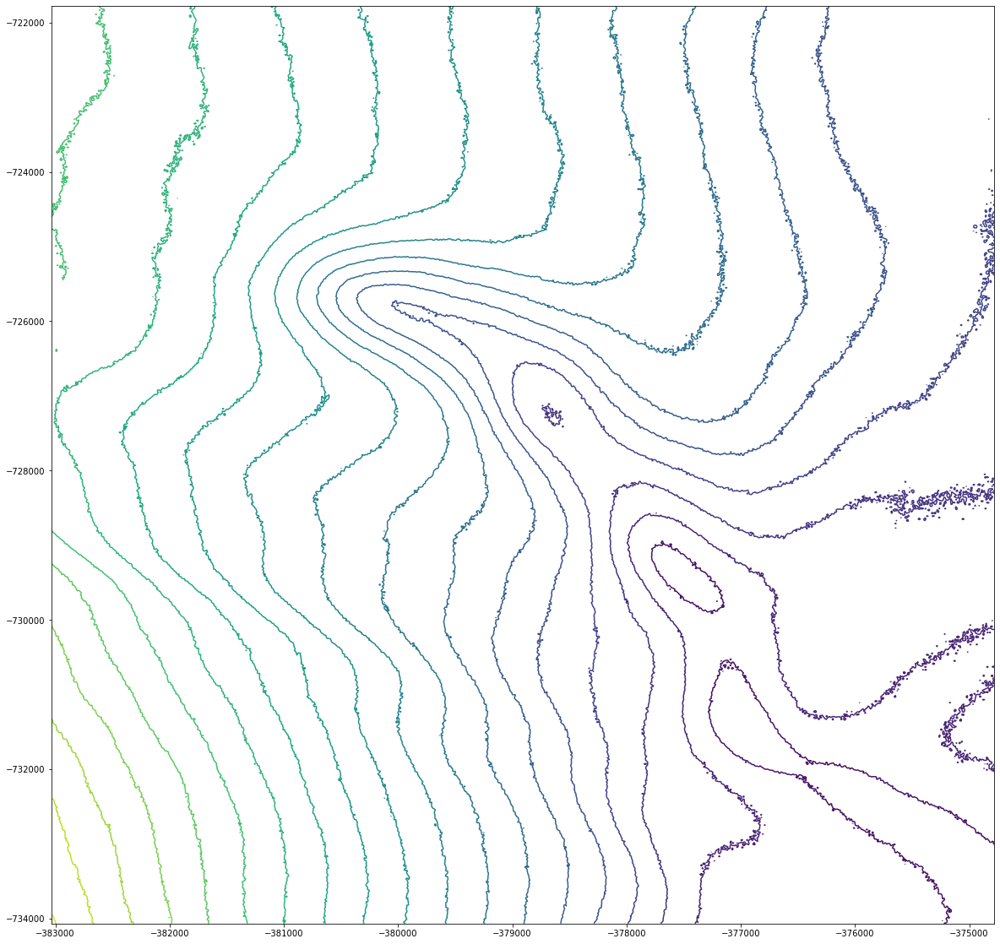

In [22]:
jj = 10

plt.figure(figsize=(20,20))
plt.contour(xv_REMA[::jj],yv_REMA[::jj],im_REMA_c[::jj],20)


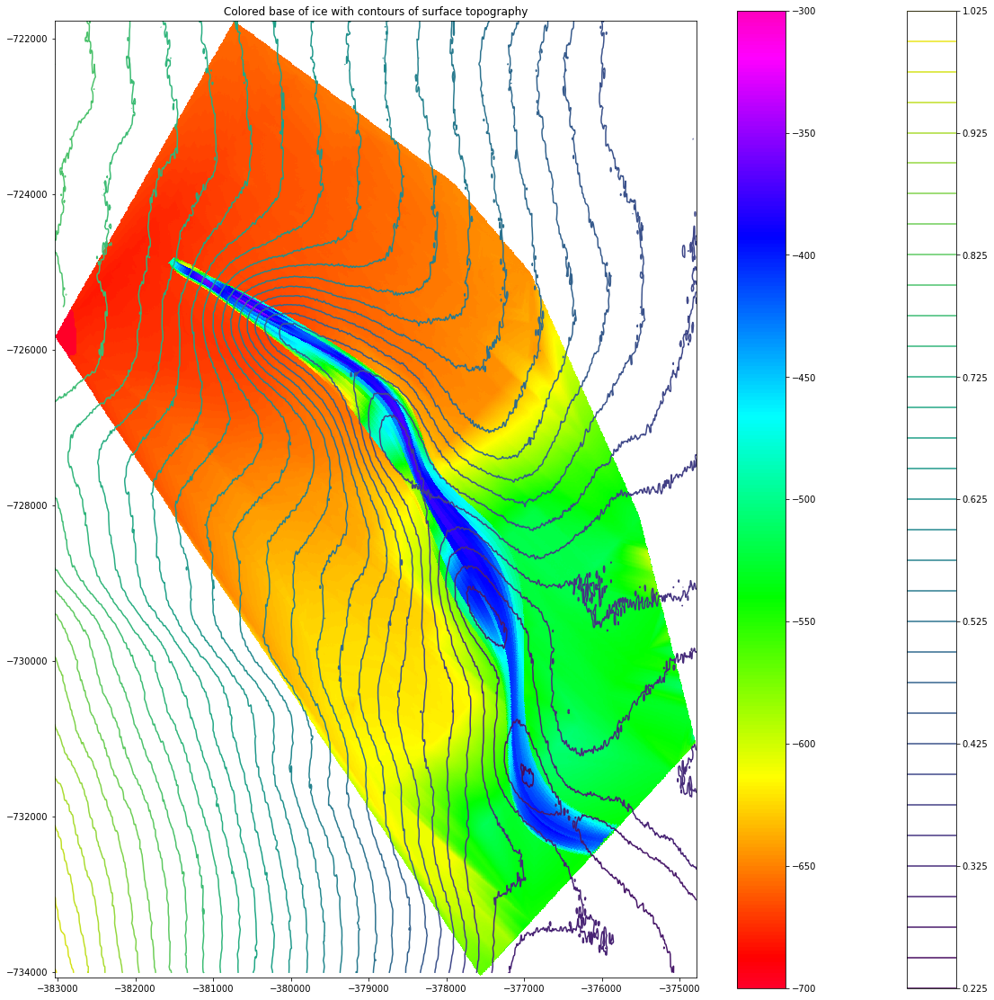

In [23]:
jj = 40

plt.figure(figsize=(20,20))
plt.contour(xv_REMA[::jj],yv_REMA[::jj],im_REMA_c[::jj],30)
plt.colorbar()
v = [-750,-350]
plt.imshow(ice_base,extent=extent_l2l,vmin=-700, vmax=-300,cmap='gist_rainbow')
plt.colorbar()
plt.title('Colored base of ice with contours of surface topography')
plt.show()

# Conclustion

Episodic discrete melt events. Each blob has a corner, and a dip

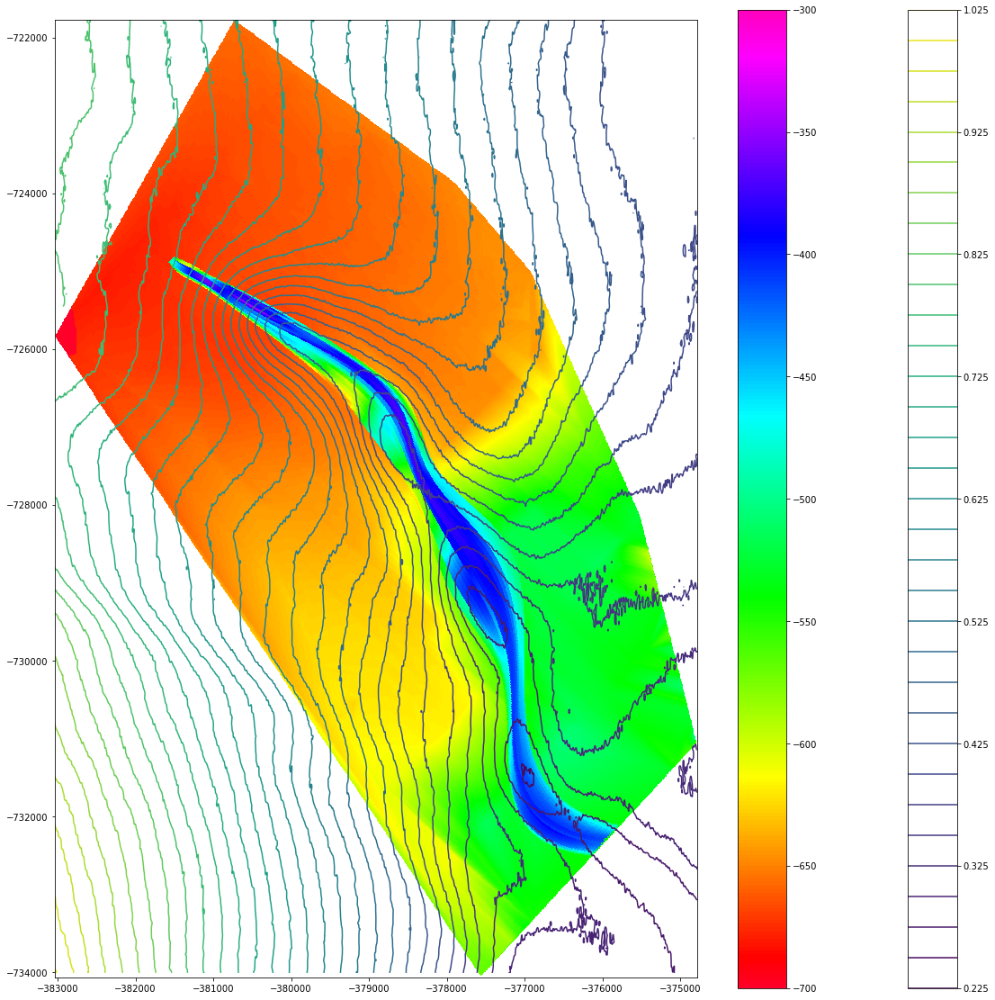

In [24]:
jj = 40

plt.figure(figsize=(20,20))
plt.contour(xv_REMA[::jj],yv_REMA[::jj],im_REMA_c[::jj],30)
plt.colorbar()
v = [-750,-350]
plt.imshow(ice_base,extent=extent_l2l,vmin=-700, vmax=-300,cmap='gist_rainbow')
plt.colorbar()
# plt.title('Colored base of ice with contours of surface topography')
plt.xlim([xmin,xmax])
plt.ylim([ymin,ymax])
plt.show()

In [25]:
ll = {} #a dictionary of geodataframes of radarlines over KIS2, ie one gdf for each line.

for line in bed_gdf[bed_gdf.camp =='KIS2'].line_name.unique().tolist():
    ll[line] = bed_gdf[(bed_gdf.line_name==line) & (bed_gdf.camp=='KIS2')].copy()
    ll[line].sort_values(by='x',inplace=True)
    ll[line].reset_index(drop=True,inplace=True)

cross_channel_lines = [ 'line7p75','line7p5','line7p25','line7', 'line6','line5','lineAPREScross','line4','line3','line2','line1','line0']

#lines which cross the channel, (ll restricted to the above subset)
cl  = {key:ll[key] for key in cross_channel_lines}

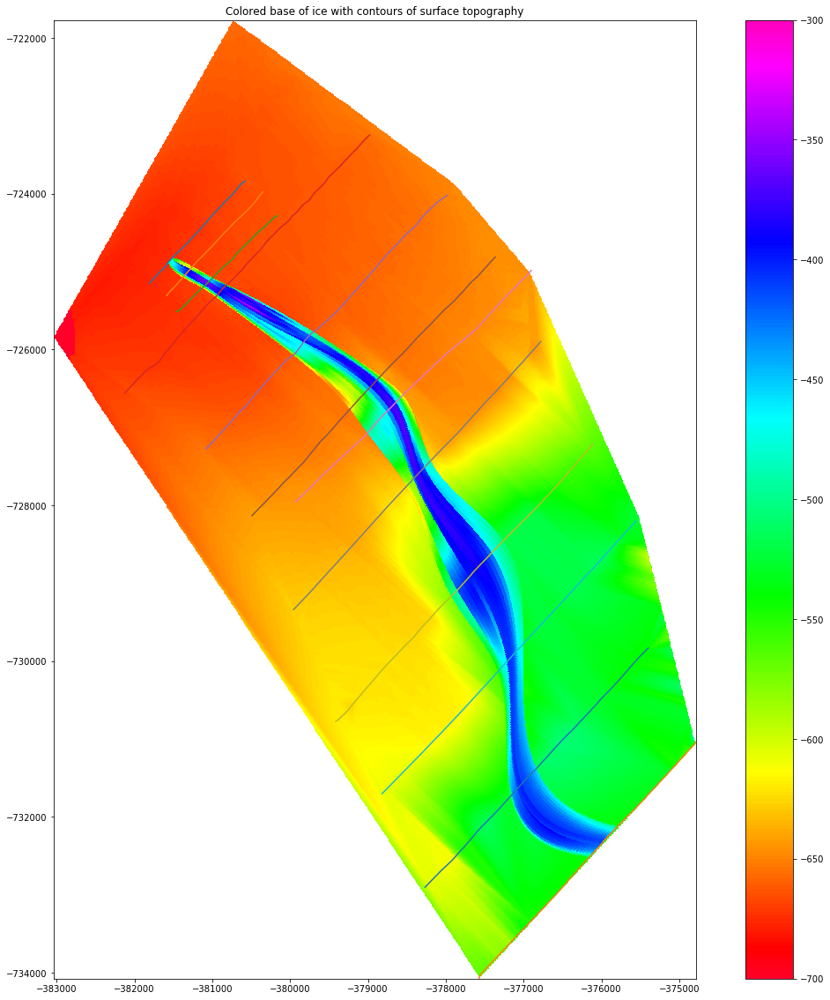

In [26]:
jj = 40

plt.figure(figsize=(20,20))
v = [-750,-350]
plt.imshow(ice_base,extent=extent_l2l,vmin=-700, vmax=-300,cmap='gist_rainbow')
plt.colorbar()
plt.title('Colored base of ice with contours of surface topography')
for line in cl.values():
    plt.plot(line.x,line.y)
plt.xlim([xmin,xmax])
plt.ylim([ymin,ymax])
plt.show()

# Four blobs hypothesis.

### Evidence

1. surface REMA, shows blobs
2. Spline down channel shows four corresponding lows
3. channel goes wide and narrow, this is evident for blob 2 and 3, loose for 4 and doesnt show for 1

# Plot channel meander with the points of radar
mid is at index 10

In [27]:
# take care running this as the variables ice_thickn points_x etc are used a few times for different interpolations
ice_thickn= np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/ice_thickn_channel.npy')
points_x = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/points_x_channel.npy')
points_y = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/points_y_channel.npy') 
# surf = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/surf_channel.npy')
# bed = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/bed_channel.npy')

#for the old radarlines
# ice_thickn_o = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/ice_thickn_channel_old.npy')
points_x_o = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/points_x_channel_old.npy')
points_y_o = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/points_y_channel_old.npy') 
# surf_o = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/surf_channel_old.npy')
# bed_o = np.load('/Users/home/whitefar/DATA/FIELD_ANT_19/POST_FIELD/RADAR_MAP/bed_channel_old.npy')

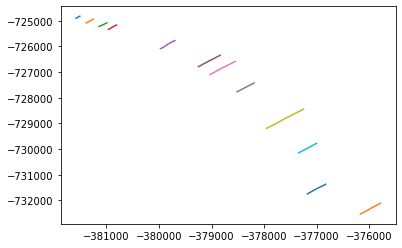

In [28]:
plt.plot(points_x,points_y)
plt.show()

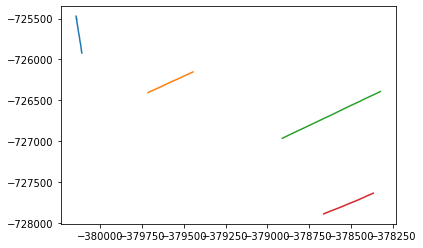

In [29]:
plt.plot(points_x_o,points_y_o)
plt.show()

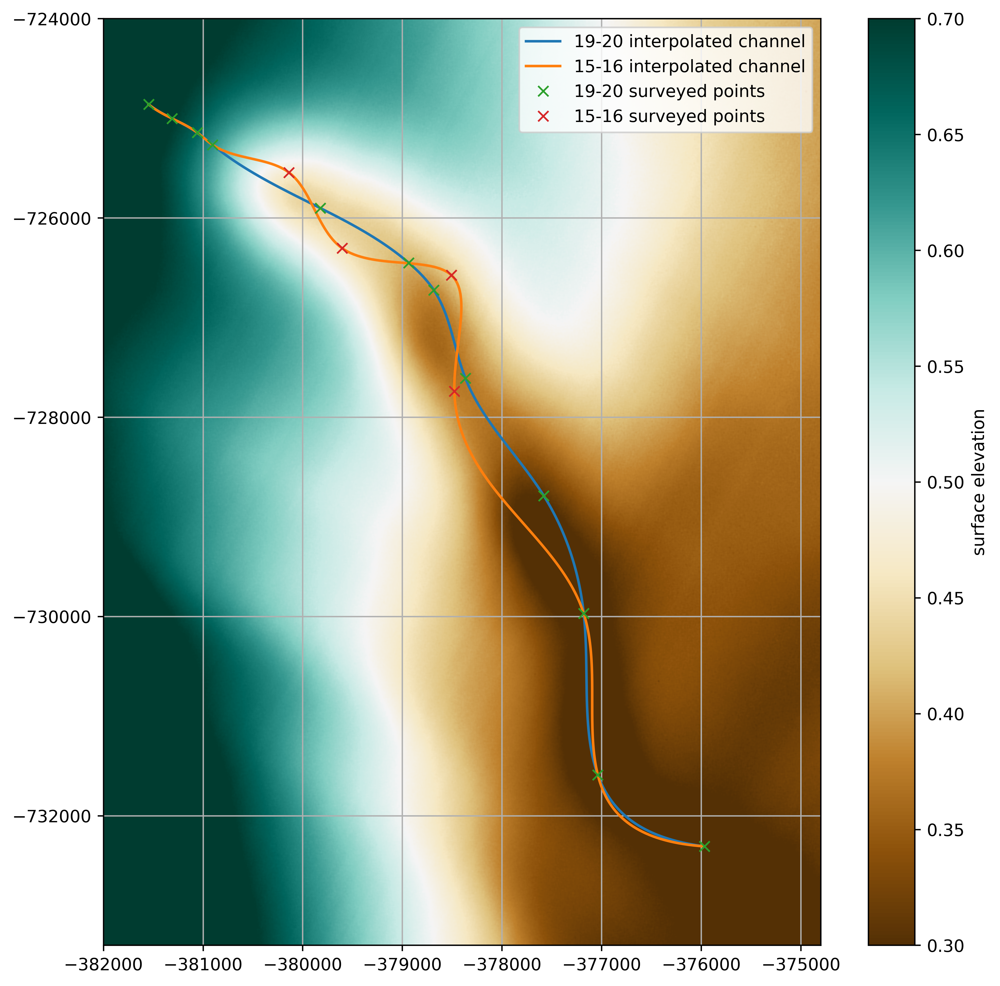

In [30]:
#rema
v=[0,1]    
i= 10

plt.figure(figsize=(10,10),dpi=500)
extent = [image.bounds[0],image.bounds[2],image.bounds[1],image.bounds[3]]
kis2 = [-380737.537026,-724683.311299]

plt.imshow(im_REMA,extent=extent_REMA,vmin=0.3,vmax=0.7, cmap='BrBG')
cb = plt.colorbar()
# plt.plot(kis2[0],kis2[1],'y^')
cb.set_label('surface elevation')

i=10
plt.plot(x_new[i,:],y_new[i,:],label="19-20 interpolated channel")
plt.plot(x_old[i,:],y_old[i,:],label="15-16 interpolated channel")

plt.plot(points_x[i,:],points_y[i,:],'x',label="19-20 surveyed points")
plt.plot(points_x_o[i,:],points_y_o[i,:],'x',label="15-16 surveyed points")

plt.legend()
# plt.title('interpolated radarlines over surf topography')
plt.xlim([-382000, -374800])
plt.ylim([-733300,-724000])
plt.grid()
plt.show()

In [31]:
#distance between old and new radar mid channel points on ApRES
Point(points_x[i,6],points_y[i,6]).distance(Point(points_x_o[i,2],points_y_o[i,2]))

231.2745193741563

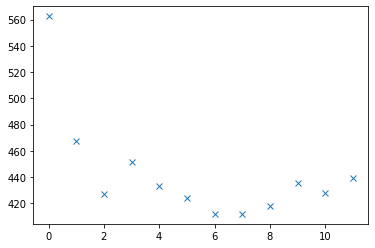

In [32]:
plt.plot(ice_thickn[10,:],'x')

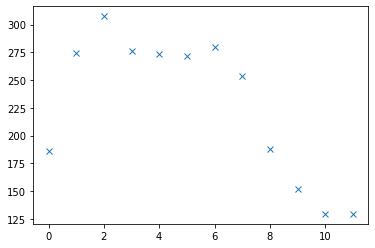

In [33]:
#depth of incision
plt.plot(ice_thickn[0,:] -ice_thickn[10,:],'x')

In [34]:
Point(points_x[10,0],points_y[10,0]).distance(Point(points_x[10,1],points_y[10,1]))

273.2304174241704

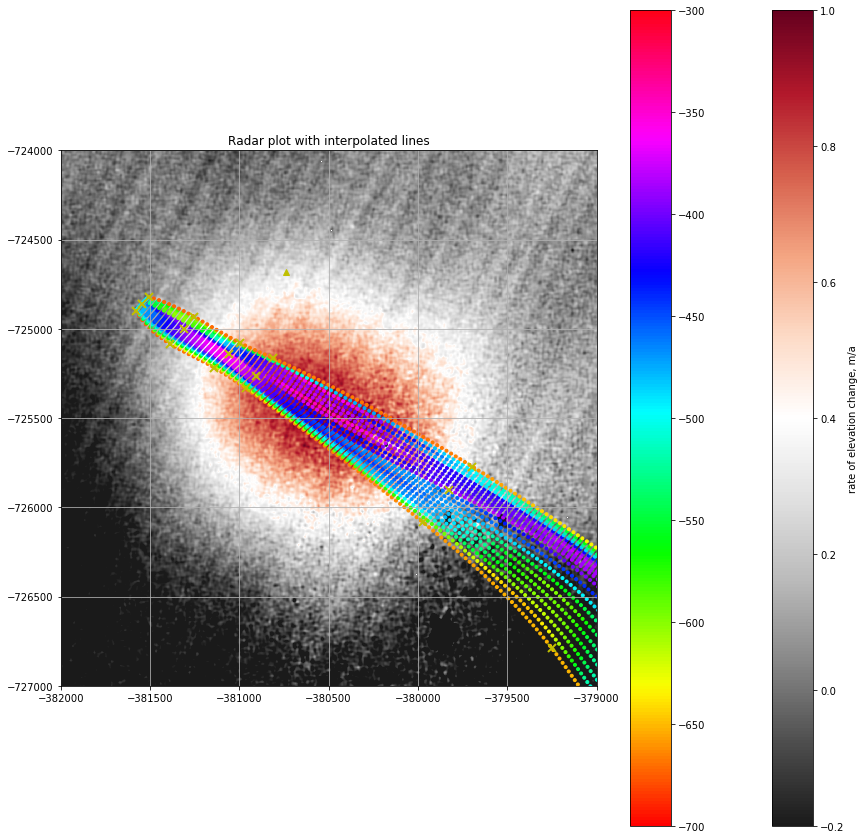

In [35]:
# plots of channel over bullseye looked inconsistent,
#PROBLEM SOLVED, WRONG EXTENT USED
#rema
v=[0,1]    

kis2 = [-380737.537026,-724683.311299]
plt.figure(figsize=(15,15))
GyRd = plt.cm.get_cmap('RdGy').reversed()
plt.imshow(im,extent=extent_REMAdiff, vmin=-0.2,vmax=1,cmap=GyRd)
cb = plt.colorbar()
plt.plot(kis2[0],kis2[1],'y^')
cb.set_label('rate of elevation change, m/a')

# radar
plt.scatter( x_new,y_new,c=ib_new,cmap='hsv',vmin=-700, vmax=-300,marker='.')
# plt.scatter( gdf.x,gdf.y,c=gdf.ice_thickn,cmap='hsv',vmin=400, vmax=800)
plt.plot(points_x[10,:],points_y[10,:],'yx',label="19-20 radar survey",markersize=8,markeredgewidth=2)
plt.plot(points_x[0,:],points_y[0,:],'yx',label="19-20 radar survey",markersize=8,markeredgewidth=2)
plt.plot(points_x[-1,:],points_y[-1,:],'yx',label="19-20 radar survey",markersize=8,markeredgewidth=2)

plt.colorbar()
plt.title('Radar plot with interpolated lines')
plt.xlim([-382000, -379000])
plt.ylim([-727000,-724000])
plt.grid()
plt.show()

## plot thickness of channel incised into ice

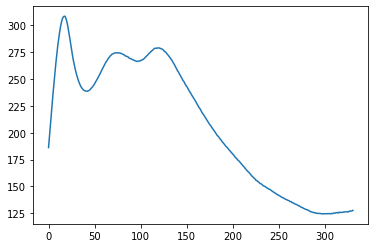

In [36]:
plt.plot(ib_new[10,:] - ib_new[0,:] )

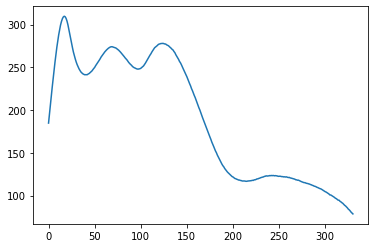

In [37]:
plt.plot(ib_new[10,:] - ib_new[-1,:] )